In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
from numpy import arange
from brpylib import NsxFile, brpylib_ver
from scipy.signal import butter, lfilter, filtfilt, freqz, welch

In [2]:
# Version control
brpylib_ver_req = "1.3.1"
if brpylib_ver.split('.') < brpylib_ver_req.split('.'):
    raise Exception("requires brpylib " + brpylib_ver_req + " or higher, please use latest version")

In [3]:
# Tune the ticks and label of figure

params = {'figure.autolayout': True,
         'legend.fontsize': 20,
          
         'axes.labelsize': 20,
         'axes.titlesize': 20,
         'axes.linewidth': 1.5,
          
         'axes.spines.left': True,
         'axes.spines.bottom': True,
          
         'xtick.labelsize': 20,
         'ytick.labelsize': 20, 
         'xtick.major.size': 3.5,
         'ytick.major.size': 3.5,
         'xtick.major.width': 1.2,
         'ytick.major.width': 1.2}
pylab.rcParams.update(params)

# Extract nsX data and saved in Blackrock nsX data files


In [2]:
folder = '/Volumes/GoogleDrive-106311891740711524512/My Drive/Lab/Lab_projects/Daron/tetrode\
/20220127_dCA1/220204'
fn = '220204_d0d0d0d0_c1001_(no_light)_000.ns6'

In [3]:
# Set the directory
datafile = folder+'/'+fn

In [4]:
# Open file and extract headers
brns_file = NsxFile(datafile)
# save a subset of data based on elec_ids
brns_file.savesubsetnsx(elec_ids=np.arange(1,17), file_suffix='(no_light)')
# Close the original datafile
brns_file.close()


220204_d0d0d0d0_c1001_(no_light)_000.ns6 opened

Writing subset file: 220204_d0d0d0d0_c1001_(no_light)_000_(no_light)_000.ns6


/Users/daron/opt/anaconda3/lib/python3.8/site-packages/brpylib.py:358: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if elec_ids != ELEC_ID_DEF and type(elec_ids) is not list:
/Users/daron/opt/anaconda3/lib/python3.8/site-packages/brpylib.py:1053: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if elec_ids == ELEC_ID_DEF:



 *** All subset files written to disk and closed ***

220204_d0d0d0d0_c1001_(no_light)_000.ns6 closed


In [ ]:
# save a subset of data based on file sizing (100 Mb)
brns_file.savesubsetnsx(file_size=(1024**2) * 100, file_suffix='size_subset')

# save a subset of data based on file timing
brns_file.savesubsetnsx(file_time_s=30, file_suffix='time_subset')

# save a subset of data based on elec_ids and timing
brns_file.savesubsetnsx(elec_ids=[1, 2, 5, 15, 20, 200], file_time_s=30, file_suffix='elecAndTime_subset')

# Close the original datafile
brns_file.close()

# Extract and plot continuous data saved in Blackrock nsX data files


In [5]:
# Open file and extract headers
nsx_file = NsxFile(datafile)
# Open No light file
# nsx_file = NsxFile(datafile.replace('.ns6','_chan1to16(no_light)_000.ns6'))

# Extract data - note: data will be returned based on *SORTED* elec_ids, see cont_data['elec_ids']
cont_data = nsx_file.getdata(elec_ids='all', 
                             start_time_s=0, 
                             data_time_s='all', 
                             downsample=2)
# cont_data_p = nsx_file.getdata()
# Close the nsx file now that all data is out
nsx_file.close()


220204_d0d0d0d0_c1001_(no_light)_000.ns6 opened

First data packet requested begins at t = 0.003400 s, initial section padded with zeros
Data extraction requires paging: 1 of 2
Data extraction requires paging: 2 of 2

220204_d0d0d0d0_c1001_(no_light)_000.ns6 closed


In [6]:
cont_data

{'elec_ids': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16],
 'start_time_s': 0.0,
 'data_time_s': 1321.2364666666667,
 'downsample': 2,
 'data': array([[  0.  ,   0.  ,   0.  , ...,  93.75, 116.25, 107.25],
        [  0.  ,   0.  ,   0.  , ..., 121.25, 110.  ,  96.25],
        [  0.  ,   0.  ,   0.  , ..., 101.25, 101.5 ,  97.25],
        ...,
        [  0.  ,   0.  ,   0.  , ...,  68.75,  60.25,  60.25],
        [  0.  ,   0.  ,   0.  , ..., 122.25, 120.5 , 141.  ],
        [  0.  ,   0.  ,   0.  , ...,  27.25,  40.  ,  51.  ]],
       dtype=float32),
 'data_headers': [{'Header': 1, 'Timestamp': 102, 'NumDataPoints': 39636991}],
 'ExtendedHeaderIndices': [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15],
 'samp_per_s': 15000.0}

In [7]:
cont_data['data_time_s']

1321.2364666666667

In [8]:
elec_ids = np.arange(1,17)  # 'all' is default for all (1-indexed)

In [9]:
SampleRate = cont_data['samp_per_s']

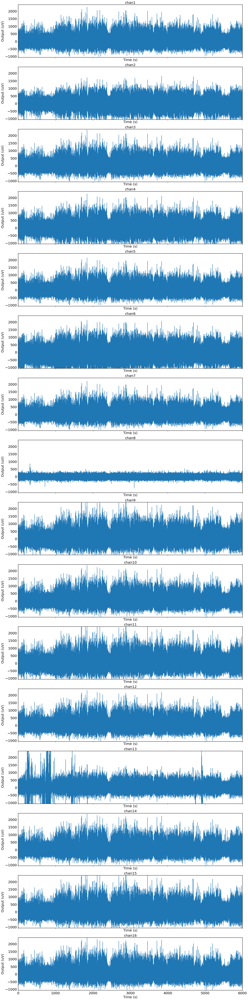

In [10]:
# Plot the individual channels
fig, ax = plt.subplots(len(elec_ids), ncols=1, figsize=(20, len(elec_ids)*5), \
                      sharex=True, sharey=True)
for i, plot_chan in enumerate(elec_ids):
    
    ch_idx  = cont_data['elec_ids'].index(plot_chan)
    hdr_idx = cont_data['ExtendedHeaderIndices'][ch_idx]
    t       = cont_data['start_time_s'] + arange(cont_data['data'].shape[1]) / cont_data['samp_per_s']
    
    ax[i].plot(t, cont_data['data'][ch_idx])
    ax[i].axis([t[0], t[-1], min(cont_data['data'][ch_idx]), max(cont_data['data'][ch_idx])])
    ax[i].locator_params(axis='y', nbins=10)
    ax[i].set_xlabel('Time (s)')
    ax[i].set_ylabel("Output (" + nsx_file.extended_headers[hdr_idx]['Units'] + ")")
    ax[i].set_title(nsx_file.extended_headers[hdr_idx]['ElectrodeLabel'])
# plt.savefig(f'Raw trace of {fn}.png', 
#             dpi = 500, transparent = True, bbox_inches = 'tight')
plt.show()

# Implement lowpass filter

In [11]:
# Filter implementation using scipy
def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
#     y = lfilter(b, a, data)
    y = filtfilt(b, a, data)
    return y

# Estimate power spectral density using Welch’s method.
Welch’s method computes an estimate of the power spectral density by dividing the data into overlapping segments, computing a modified periodogram for each segment and averaging the periodograms.

In [12]:
ipi = int(100*1e-3*SampleRate) # inter pulse interval
window = int(10000*1e-3*SampleRate) # data points in 10 s
nps = int(.5*SampleRate) # length of the FFT used

In [13]:
def plot_welch(cont_data,index,label,color):
    pxx_list = []
    for plot_chan in index:
        
        ch_idx  = cont_data['elec_ids'].index(plot_chan)
        hdr_idx = cont_data['ExtendedHeaderIndices'][ch_idx]
        t       = cont_data['start_time_s'] + arange(cont_data['data'].shape[1]) / cont_data['samp_per_s']
        
        if t.shape[0]-cont_data['data'][ch_idx].shape[0]==0:
            data = butter_lowpass_filter(cont_data['data'][ch_idx], 150, SampleRate, order=6)
            f, pxx = welch(data, fs=SampleRate, noverlap=nps/2, nperseg=nps)
            pxx_list.append(pxx)
        else:
            print('Error! The x and y should have the same scale!')
        print(f'\rPlotting {plot_chan+1} trace', end='')
    print(f'\rDone!'+' '*50)
    pxx_mean = np.mean(pxx_list, axis=0)
    px_std = np.std(pxx_list, axis=0)
    plt.plot(f, np.sqrt(pxx_mean), alpha=.5, label=label, color=color)
    plt.fill_between(f, np.sqrt(abs(pxx_mean-px_std)), np.sqrt(abs(pxx_mean+px_std)), 
                     alpha=.4, facecolor=color)

## Plot the welch results

In [14]:
np.arange(13)[-4:]

array([ 9, 10, 11, 12])

In [15]:
fn

'211225_d4d0d0d0001.ns6'

Done!                                                  
Done!                                                  
Done!                                                  
Done!                                                  


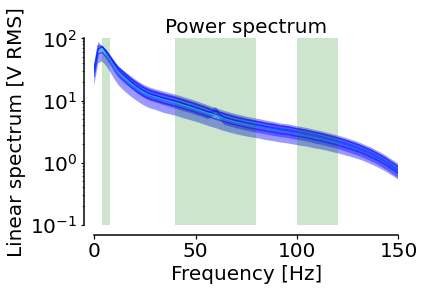

In [16]:
plot_welch(cont_data,np.arange(5)[-4:],'Tetrode1 (1900 $\mu$m)','cyan')
plot_welch(cont_data,np.arange(9)[-4:],'Tetrode2 (1800 $\mu$m)','blue')
plot_welch(cont_data,np.arange(13)[-4:],'Tetrode3 (1800 $\mu$m)','blue')
plot_welch(cont_data,np.arange(17)[-4:],'Tetrode4 (1800 $\mu$m)','blue')
plt.fill_between([4,8], 1e-1, 1e2, alpha=.2, facecolor='green')
plt.fill_between([40,80], 1e-1, 1e2, alpha=.2, facecolor='green')
plt.fill_between([100,120], 1e-1, 1e2, alpha=.2, facecolor='green')
# plt.legend(loc='best')
plt.yscale('log')
plt.xlim([0,150]) 
plt.ylim([10**(-1),10**(2)])
plt.xlabel('Frequency [Hz]')
plt.ylabel('Linear spectrum [V RMS]')
plt.title('Power spectrum')
ax = plt.gca()
# Hide the spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Move spines outward by 10 points
ax.spines['left'].set_position(('outward', 10))
ax.spines['bottom'].set_position(('outward', 10))
[plt.savefig(f'Welch_{fn[:-4]}.{ff}', dpi=500, transparent=True, bbox_inches='tight')
     for ff in ['svg','png']]
plt.show()

# Implement the power spectral density 

In [17]:
def extract_cont_data(cont_data, ind):
    '''
    Input:cont_data include the whole data import from the ns6 file;
          ind is the number of channel
    '''
    ch_idx  = cont_data['elec_ids'].index(ind)
    hdr_idx = cont_data['ExtendedHeaderIndices'][ch_idx]
    t       = cont_data['start_time_s'] + arange(cont_data['data'].shape[1]) / SampleRate
    if t.shape[0]-cont_data['data'][ch_idx].shape[0]==0:
        data = cont_data['data'][ch_idx]
    else:
        print('Error! The x and y should have the same scale!')
    return t,data


In [18]:
def spectrum(cont_data, index, nfft, highcut=  ):
#     fig, ax = plt.subplots(nrows=1, ncols = len(index), figsize=(len(index)*15,10),
#                             sharex=True, sharey=True)
    ax[j,0].set_ylabel(f'Tetrode{j+1} (1800 $\mu$m)')
    ax[j,0].set_xlabel('Time (s)')
    for i,ind in enumerate(index):
        t, rawdata = extract_cont_data(cont_data, ind)
        data = butter_lowpass_filter(rawdata, highcut, SampleRate, order=6)
        # Calculate the powerSpectrum (pS), freqenciesFound (fF), time (ti), imageAxis (iA)
        pS,fF,ti,iA = ax[j,i-1].specgram(data,NFFT=nfft,Fs=SampleRate,noverlap=nfft/2,
                                         cmap=plt.cm.jet,vmin=-10,vmax=40)
        ax[j,i-1].plot([t[0],int(t[-1])],[4,4],c='white',alpha=.3)
        ax[j,i-1].plot([t[0],int(t[-1])],[8,8],c='white',alpha=.3)
        ax[j,i-1].set_ylim([0,highcut])

        # Hide the spines
        ax[j,i-1].spines['right'].set_visible(False)
        ax[j,i-1].spines['top'].set_visible(False)

        # Move spines outward by 10 points
        ax[j,i-1].spines['left'].set_position(('outward', 10))
        ax[j,i-1].spines['bottom'].set_position(('outward', 10))

        print(f'\rPlotting {ind}th trace', end='')
    plt.tight_layout()
#     plt.colorbar()
    print(f'\rDone!'+' '*50)
    
    return pS,fF,ti,iA

Done!                                                  
Done!                                                  
Done!                                                  
Done!                                                  


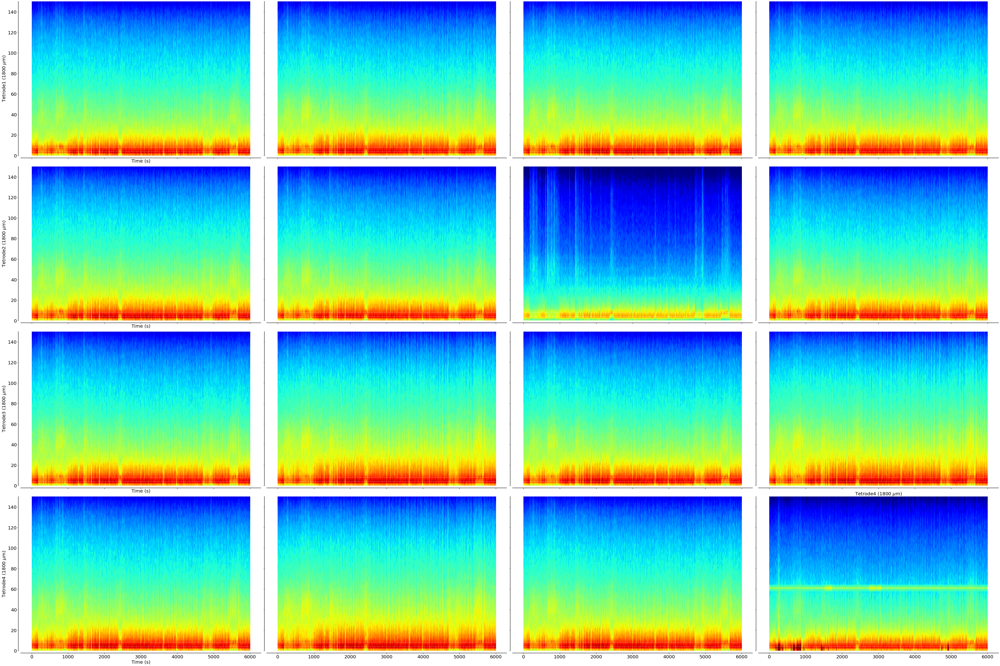

In [19]:
fig, ax = plt.subplots(nrows=4,ncols=4,figsize=(4*15,4*10),sharex=True,sharey=True)
for j,i in enumerate(arange(5)[1:]):
    spectrum(cont_data,np.arange(i*4+1)[-4:], nfft=nps)
    if i ==1:
        plt.title(f'Tetrode{i} (1900 $\mu$m)')
    else:
        plt.title(f'Tetrode{i} (1800 $\mu$m)')
[plt.savefig(f'Welch_singleChan_{fn[:-4]}.{ff}', dpi=300, transparent=True, bbox_inches='tight')
 for ff in ['svg','png']]
plt.show()
# plt.colorbar()

# Analyze the effect light activation

## light pulse detection

In [20]:
# Analyze the light response
t, light = extract_cont_data(cont_data, 129)
lit = light[0:int(25*SampleRate)]
tt = t[0:int(25*SampleRate)]
id_lon=np.where(light>100)[0][0]

In [12]:
import pandas as pd

In [13]:
file_directory = folder+'/220204_chan1to16_timestamps.csv'

In [14]:
df = pd.read_csv(file_directory)

In [15]:
df

,chan13a,chan13b,chan13c,chan1a,chan1b,chan1c,chan5a,chan9a,chan9b,chan9c,chan9d
0,0.299967,0.014167,2.365633,0.478933,6.004967,0.012700,0.003933,4.412200,6.426833,0.939800,175.267033
1,1.254333,0.021900,2.598233,0.970100,14.512900,0.033467,0.021400,9.179800,10.732967,0.947133,175.727167
2,2.373533,0.159500,2.954233,0.976167,15.794067,0.045233,0.189433,15.062033,12.628767,0.980600,175.743800
3,2.779333,0.644467,3.330767,3.012767,17.529333,0.053167,0.213167,16.202700,15.800733,0.997000,176.166233
4,2.794467,0.656100,5.305233,3.248533,18.287767,0.078733,0.269533,32.096633,16.414433,1.418000,176.287867
...,...,...,...,...,...,...,...,...,...,...,...
8512,NaN,1321.056500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8513,NaN,1321.063633,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8514,NaN,1321.147867,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8515,NaN,1321.160200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
timestamp = df.to_numpy(dtype='float',na_value=np.nan).T

In [17]:
file_directory.replace('/','_').replace('-','_').replace('.','_').split('_')

['',
 'Volumes',
 'GoogleDrive',
 '106311891740711524512',
 'My Drive',
 'Lab',
 'Lab',
 'projects',
 'Daron',
 'tetrode',
 '20220127',
 'dCA1',
 '220204',
 '220204',
 'chan1to16',
 'timestamps',
 'csv']

In [18]:
fn = '%s_%s'%tuple([file_directory.replace('/','_').replace('-','_').replace('.','_').split('_')[i] 
                                  for i in(-7,-6)])

In [19]:
fn

'20220127_dCA1'

## Raster plot

In [29]:
def rasterplot(spk,trial_length,filename):
    # Prepare the dataset for eventplot
    trials = []
    hist = []
    for i in range(int(6000/trial_length)):
        x = spk[np.where(np.logical_and(spk>=trial_length*(i),spk<=trial_length*(i+1)))]%trial_length
        trials.append(x)
        [hist.append(s) for s in x]
    fig, ax = plt.subplots(nrows=2,ncols=1,figsize=(2*15,2*10),sharex=True)    
    # Plot the raster plot
    ax[0].eventplot(np.array(tt[np.where(lit>100)[0]], dtype='object'),
                lineoffsets=[len(trials)+2],linelengths=2,linewidths=1,colors='Blue')
    ax[0].eventplot(np.array(trials, dtype='object'),
                    linelengths=1,linewidths=2,colors='black', alpha=.7)
    ax[0].fill_between([tt[id_lon],tt[int(id_lon+SampleRate*10)]],
                       -1,len(trials),alpha=.3,color='cyan')
    ax[0].set_xlabel('time (s)')
    ax[0].set_ylabel('Trials')
    ax[0].set_title('Raster plot')
    # Plot the histogram
    n, bins, patches=plt.hist(hist,bins=trial_length*3,color='black',density=True,histtype='stepfilled')
    # plt.plot((bins[1:]+bins[:-1])/2,n+.2)
    # plt.fill_between(np.linspace(bins[0],bins[-1], len(n)),np.zeros(len(n)),n,
    #                  alpha=.7,color='gray')
    ax[1].text(0,max(n),f'Firing rate: {round(len(spk[~np.isnan(spk)])/6000,3)} Hz',
               fontsize=20)
#     n, bins, patches=plt.hist(hist,bins=trial_length*10,
#                               color='black',density=True,histtype='stepfilled')
#     ax[1].set_xlabel('time (s)')
#     ax[1].set_ylabel('Trials')
    ax[1].fill_between([tt[id_lon],tt[int(id_lon+SampleRate*10)]],
                     0,np.max(n),alpha=.3,color='cyan')
    for a in ax:

        # Hide the spines
        a.spines['right'].set_visible(False)
        a.spines['top'].set_visible(False)

        # Move spines outward by 10 points
        a.spines['left'].set_position(('outward', 10))
        a.spines['bottom'].set_position(('outward', 10))
    [plt.savefig(f'{filename}.{ff}', dpi=500, transparent=True, bbox_inches='tight')
     for ff in ['svg','png']]
    return(trials)

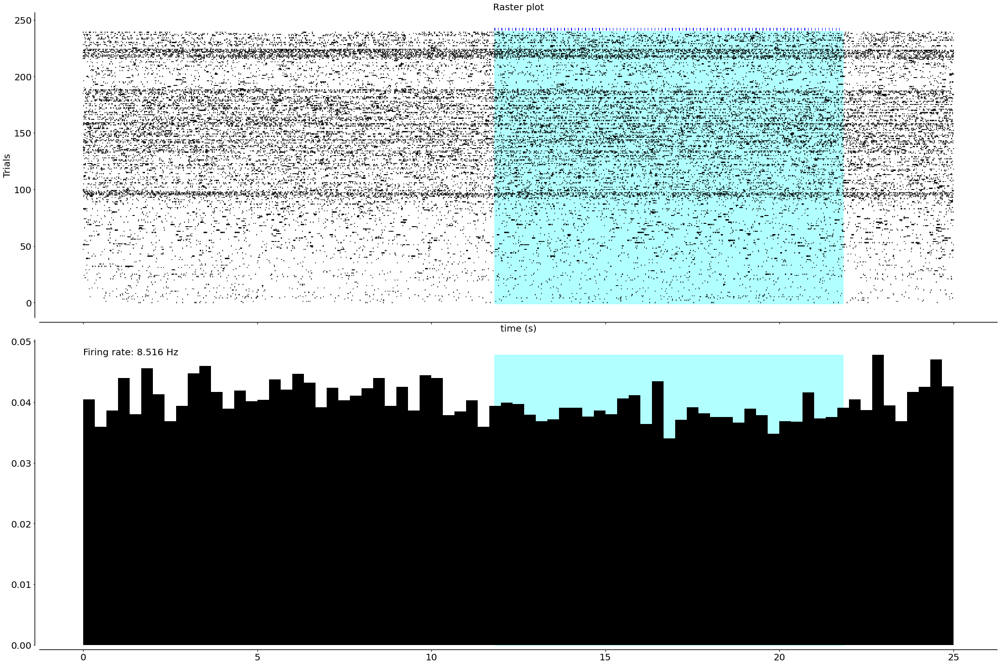

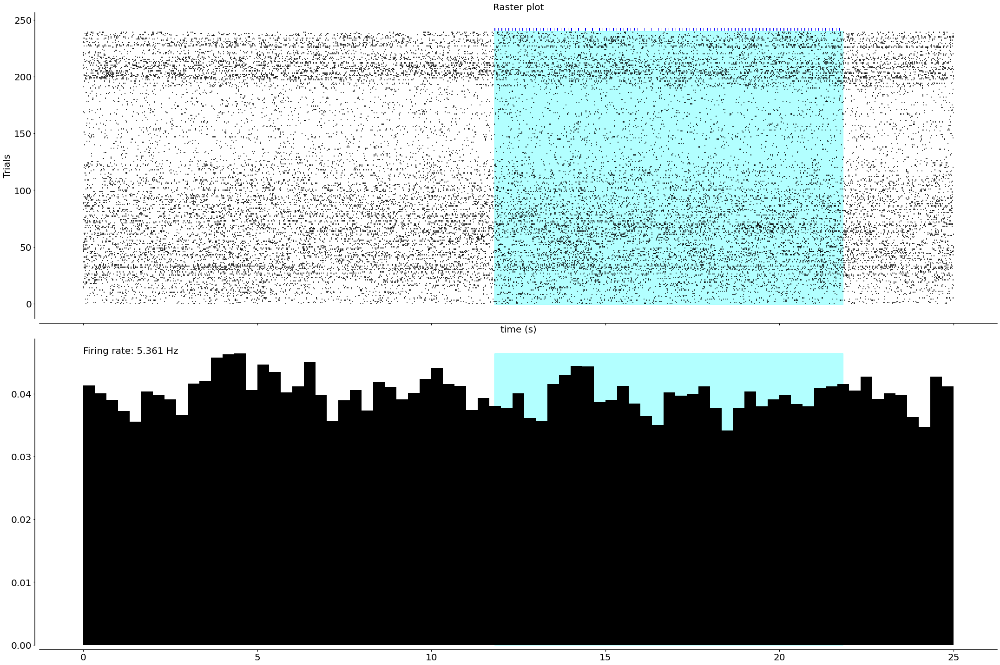

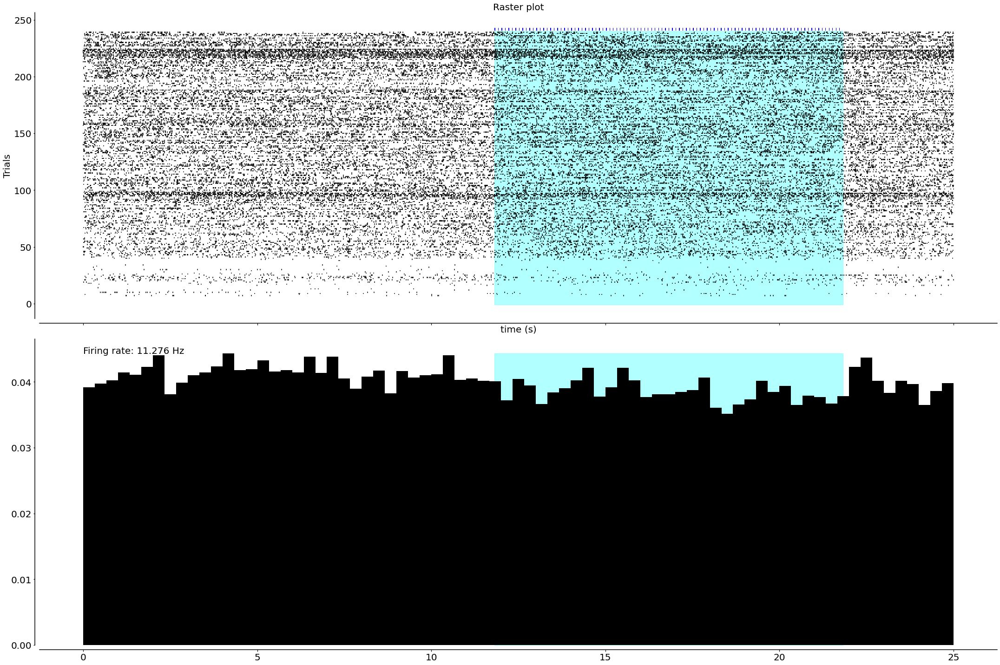

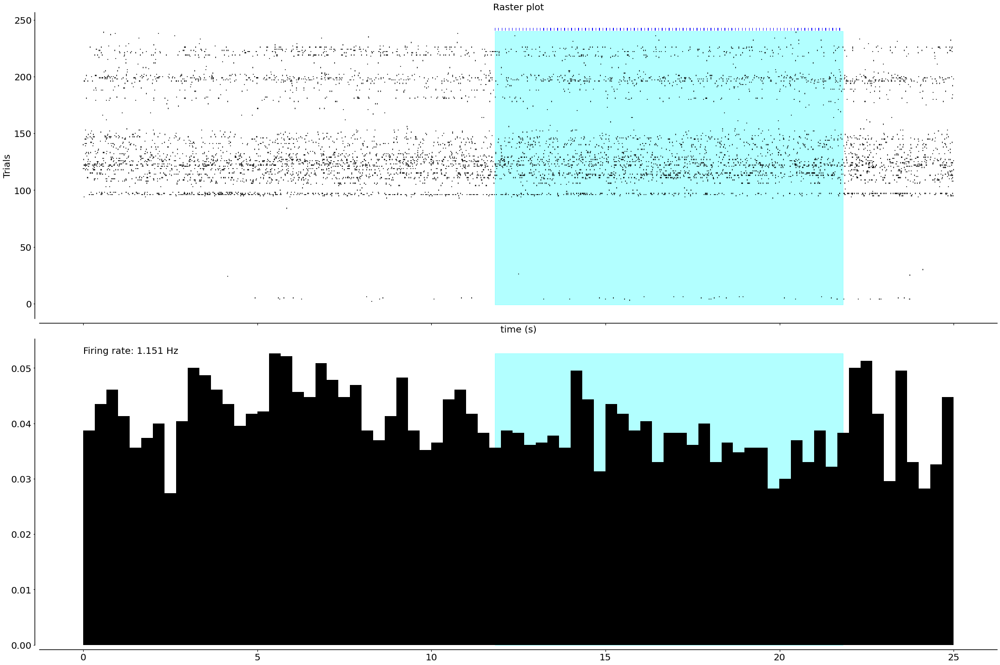

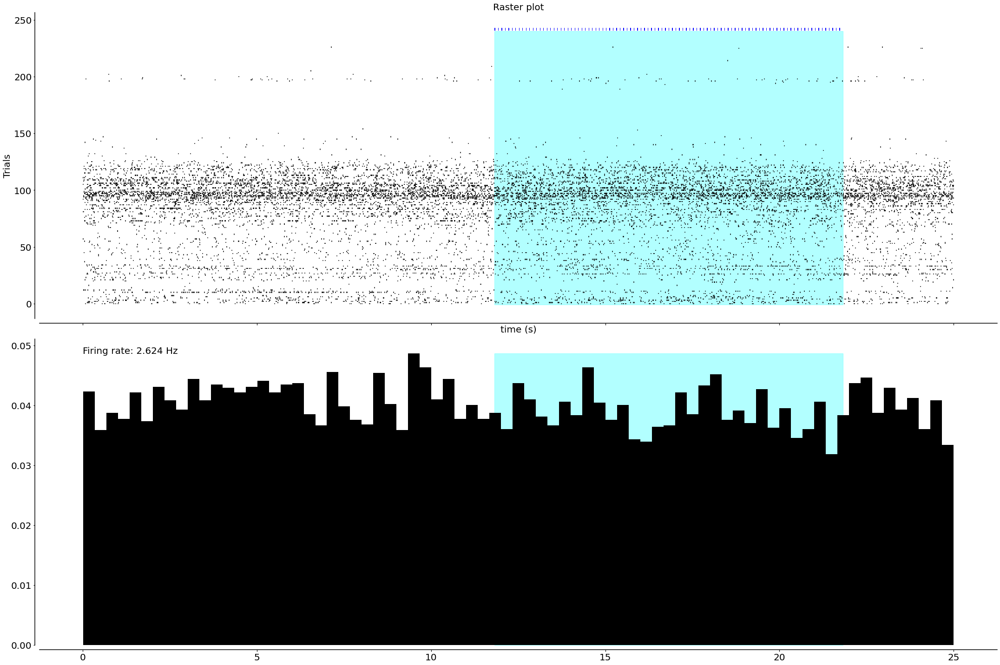

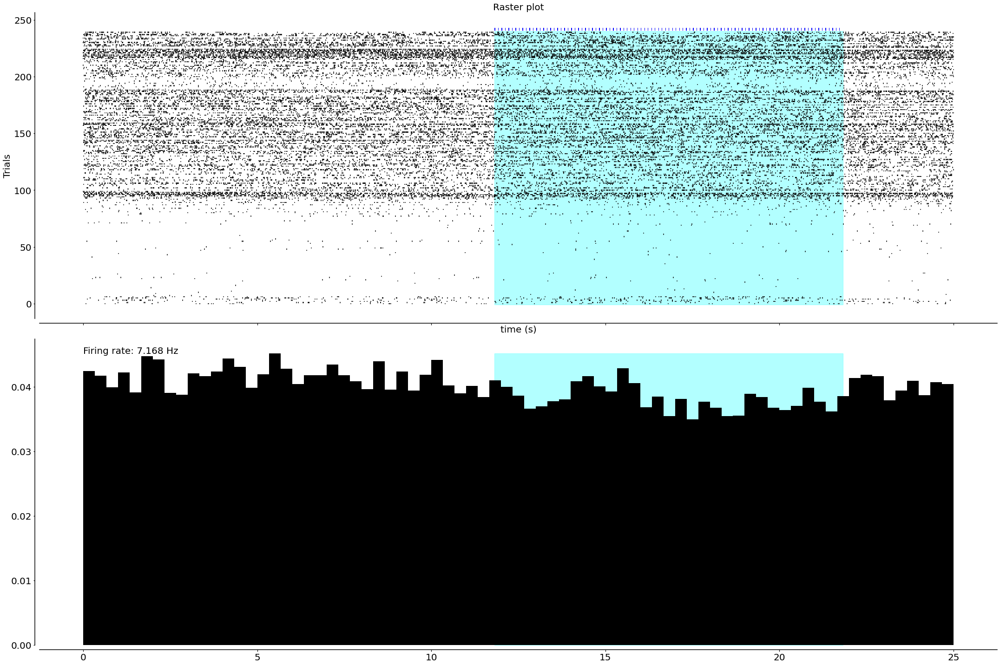

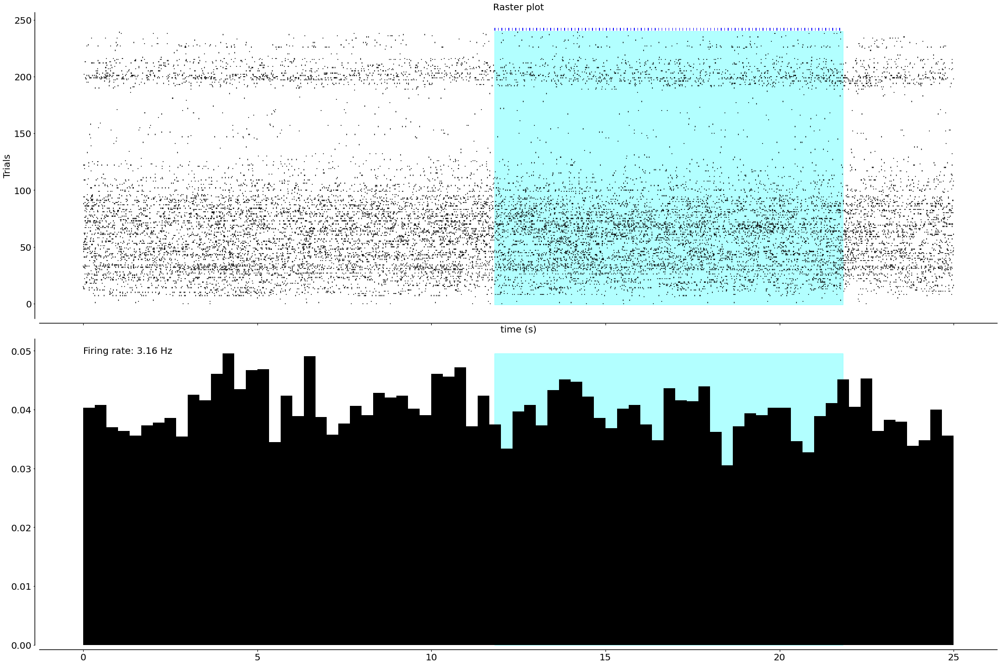

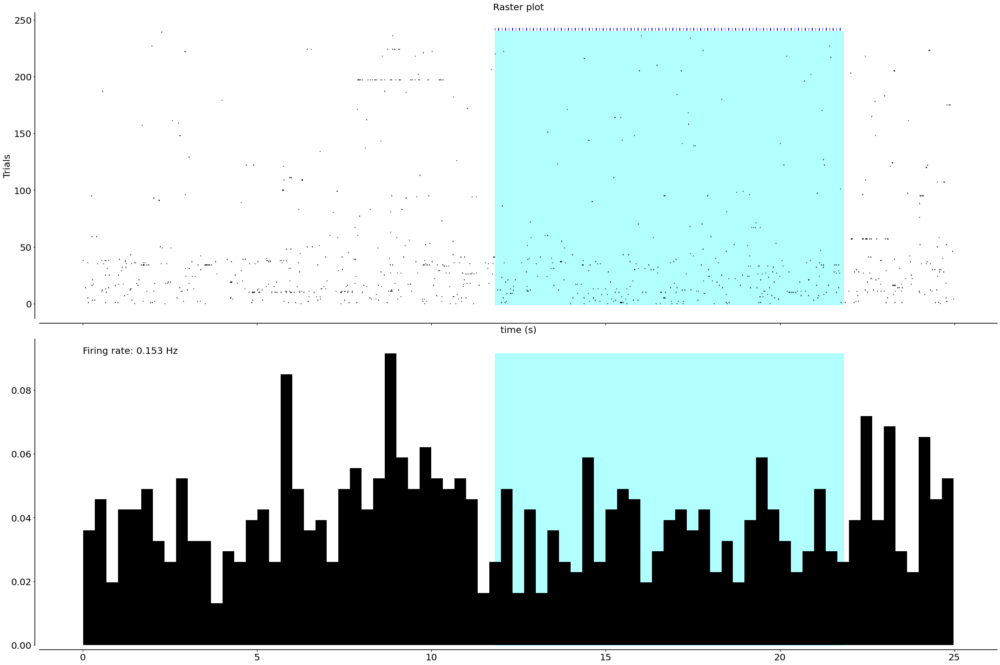

In [30]:
trial_list = []
for i,ts in enumerate(timestamp):
    trls = rasterplot(timestamp[i],25,f'{fn}_Raster_unit{i+1}')
    trial_list.append(trls)

## Scatter & Pie plot

In [31]:
t10pre = t[int(id_lon-SampleRate*10)]
t0 = t[id_lon]
t10post = t[int(id_lon+SampleRate*10)]

In [32]:
evtD = lambda Epost,Epre: Epost-Epre

In [33]:
def SRplot(trials,filename):
    ec = np.array([evtD(len(*np.where(np.logical_and(trl>t0, trl<t10post))),
                        len(*np.where(np.logical_and(trl>t10pre, trl<t0))))
                   for trl in trials])

    pre,post = [],[]
    for trl in trials:
        pre.append(len(*np.where(np.logical_and(trl>t10pre, trl<t0))))
        post.append(len(*np.where(np.logical_and(trl>t0, trl<t10post))))

    labels_ind = ['Inhibited', 'Excited', 'No response']
    colors_ind = ["cyan", "pink", "gray"]
    explode = (0, 0, 0)  
    sizes_res1 = [len(*np.where(ec<0)) , len(*np.where(ec>0)), len(*np.where(ec==0)) ]
    # Plot the pie
    fig, ax = plt.subplots(nrows=2,ncols=1,figsize=(10,20))
    ax[0].pie(sizes_res1, explode=explode, colors = colors_ind, labels=labels_ind, autopct='%1.1f%%',
            shadow=False, startangle=90)
    

    # Plot the scatter plot
    x,y=pre,post
    cutoff=np.std(ec)
    text=['baseline','light']
    # cell_res = []
    # c_list = np.arange(-cutoff,cutoff*2 ,cutoff) #Decision boundary 
    lx = np.linspace(0,top := max([np.max(x),np.max(y)]),1000) 
    #Calculate the y value 
    # ly = lambda x, c: x+c
    color = colors_ind
    for i, (pre,post) in enumerate(zip(x, y)):
    #     print(delta)
        delta = (pre-post)
        if delta>=cutoff:#Inhibited 
            ax[1].scatter(x[i]+np.random.randn(1)/10,y[i]+np.random.randn(1)/10,s=50,
                      facecolors='none',edgecolors=color[0],alpha=.8)
    #         cell_res.append('INH')
        elif delta<=-cutoff:#Excited 
            ax[1].scatter(x[i]+np.random.randn(1)/10,y[i]+np.random.randn(1)/10,s=50,
                      facecolors='none',edgecolors=color[1],alpha=.7)
    #         cell_res.append('EXT')
        elif abs(delta)<=cutoff:#No response 
            ax[1].scatter(x[i]+np.random.randn(1)/10,y[i]+np.random.randn(1)/10,s=50,
                      facecolors='none',edgecolors=color[2],alpha=.7)
    #         cell_res.append('NS')
        else:
            print(f'Error encounter in {i}th point!')
            next

    ax[1].plot([0,(max(x)**2+max(y)**2)**.5],[0,(max(x)**2+max(y)**2)**.5],
               color = 'gray', alpha = 0.5) 
    ax[1].axis('square')
    ax[1].set_xlim(-1,top+1)
    ax[1].set_ylim(-1,top+1)
    ax[1].set_xlabel(f'{text[0]} (spike count)')
    ax[1].set_ylabel(f'{text[1]} (spike count)')

    ax[1].spines['right'].set_visible(False)
    ax[1].spines['top'].set_visible(False)

    # Move spines outward by 10 points
    ax[1].spines['left'].set_position(('outward', 10))
    ax[1].spines['bottom'].set_position(('outward', 10))
    [plt.savefig(f'{filename}_SRplot.{ff}', dpi=500, transparent=True, bbox_inches='tight')
         for ff in ['svg','png']]
    plt.show()

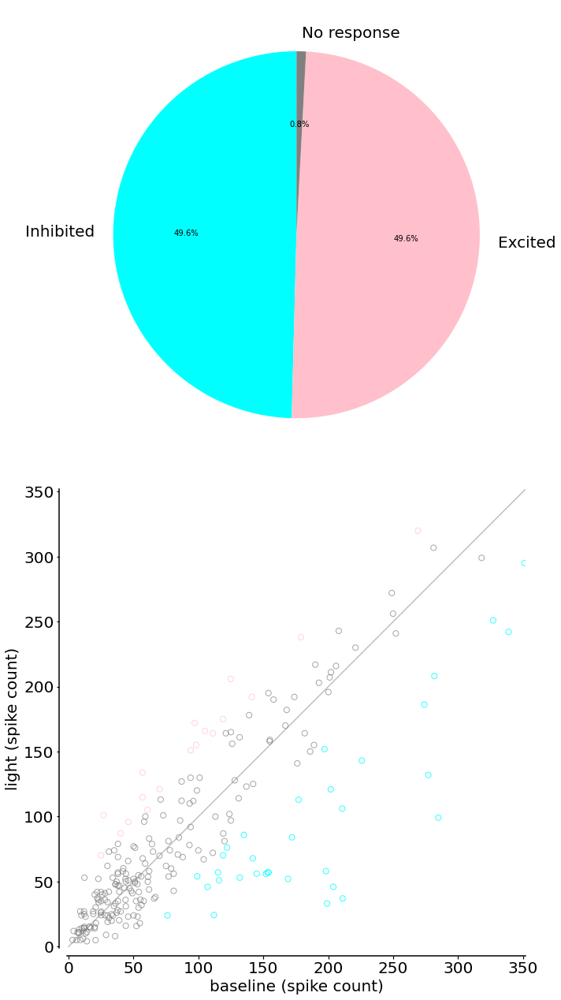

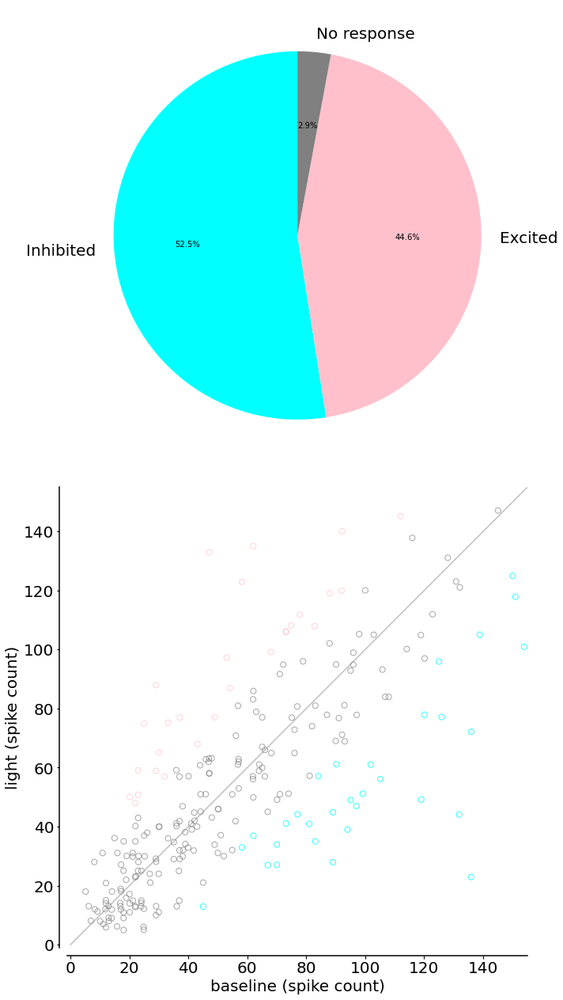

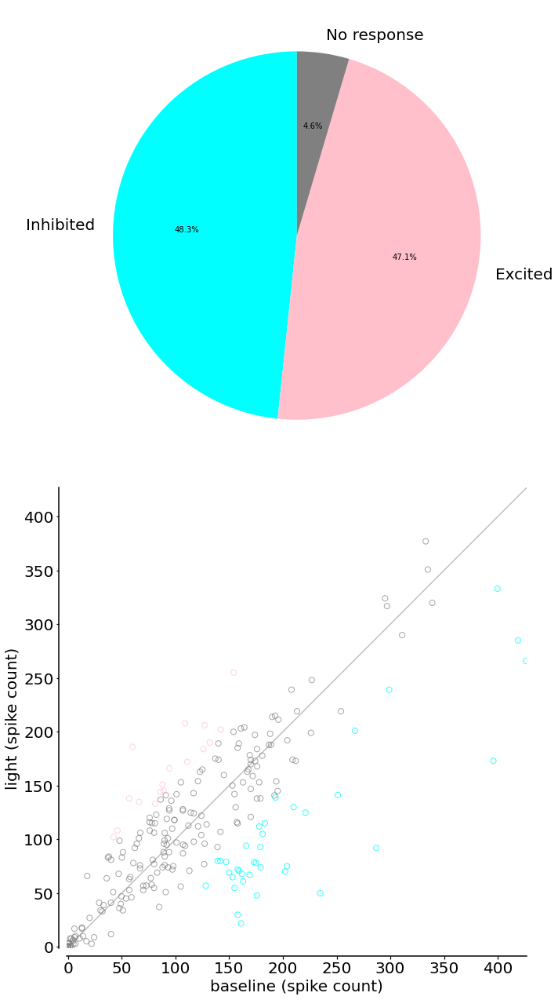

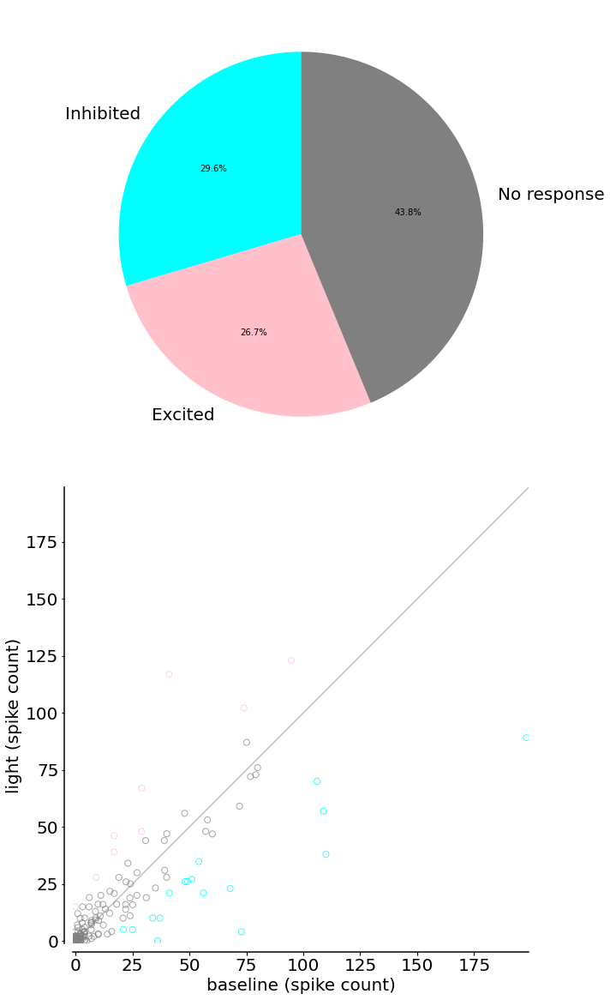

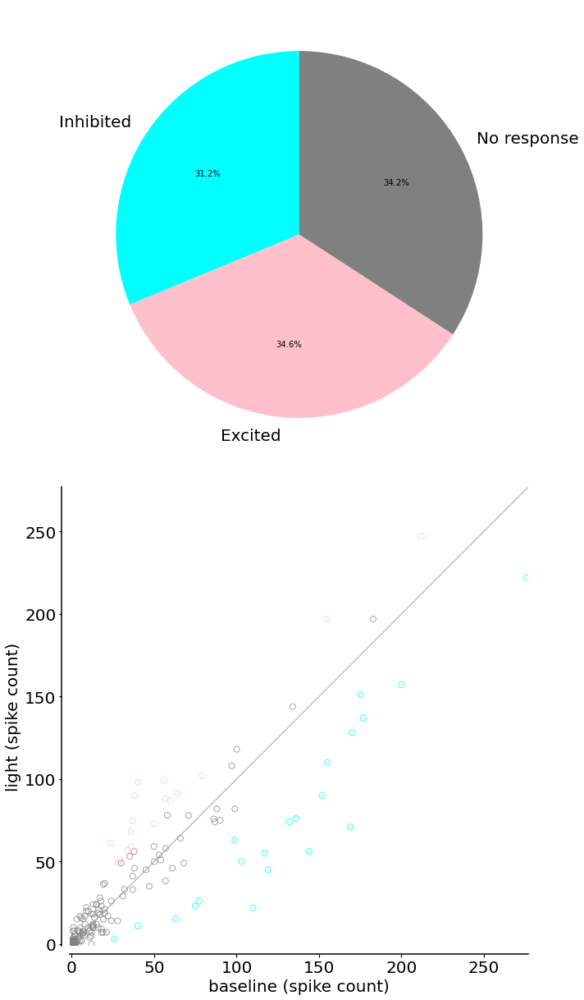

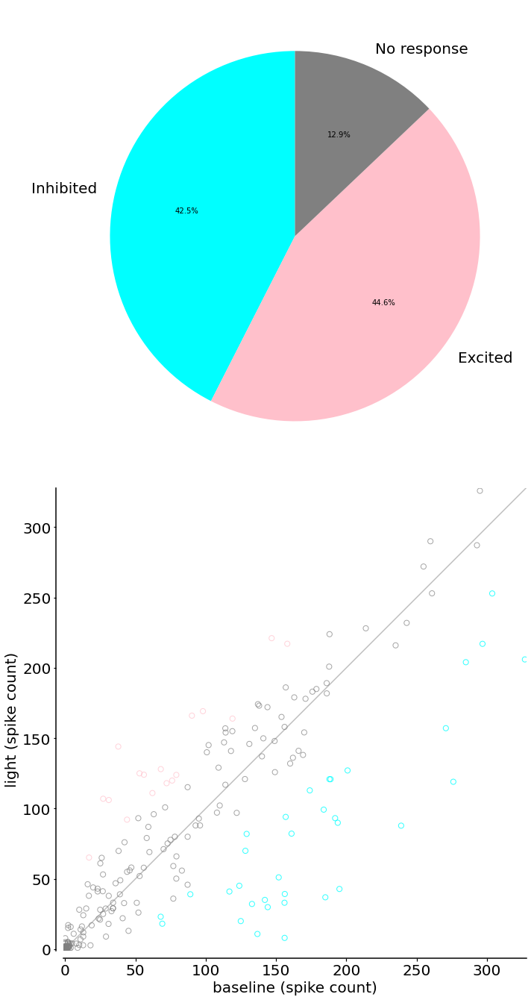

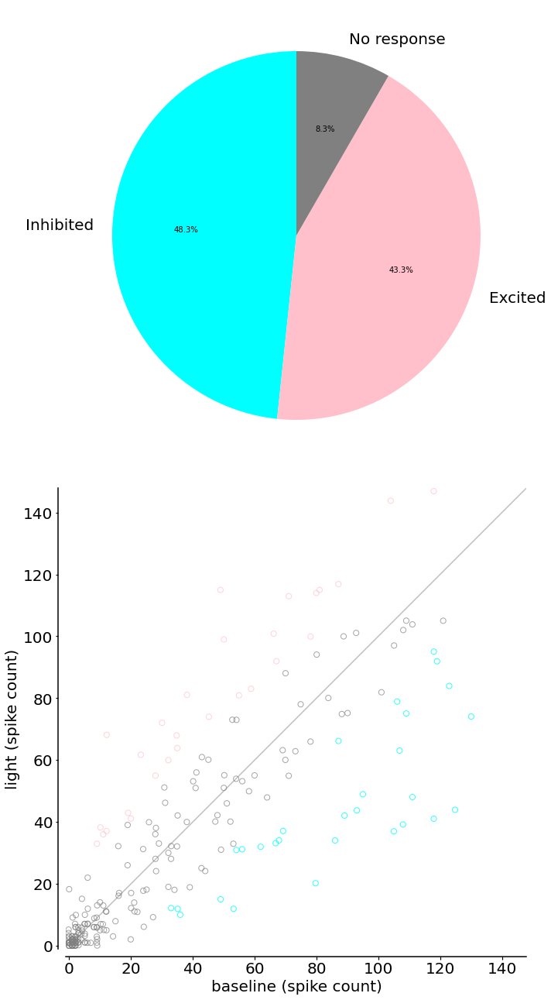

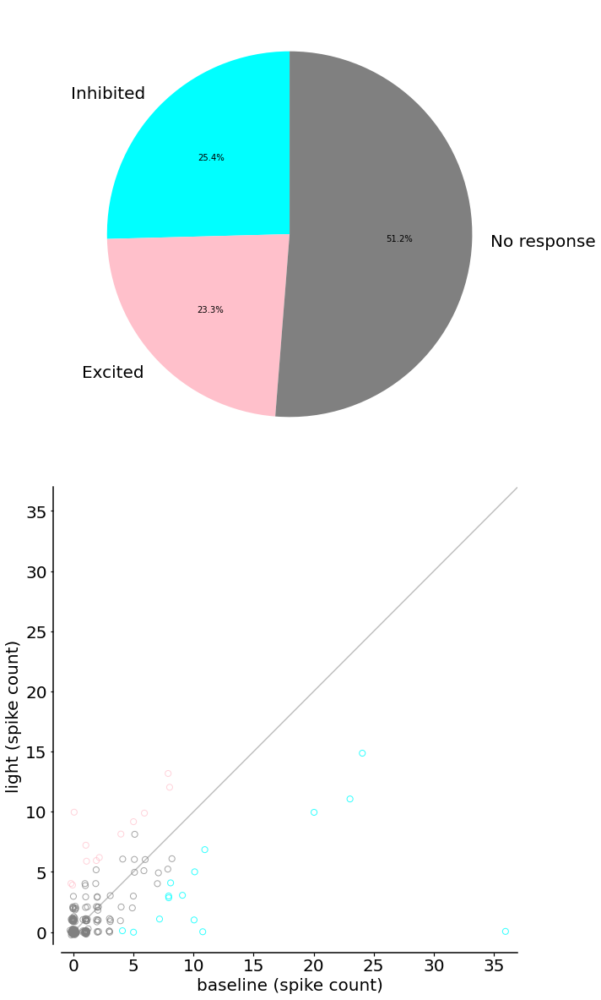

In [34]:
for i,trls in enumerate(trial_list):
    SRplot(trls,f'{fn}_SRplot_unit{i+1}')

## Analyze the waveform

### Import the waveform data autocorrelogram data

In [20]:
waveforms = np.loadtxt(file_directory.replace('timestamps', 'waveforms'),
                      delimiter=',',skiprows=1).T
autocorrelograms = np.loadtxt(file_directory.replace('timestamps', 'autocorrelograms'),
                      delimiter=',',skiprows=1).T

In [21]:
burstIndex = lambda bins,spk_count: np.sum(spk_count[np.logical_and(bins>=3,bins<=5)])/np.sum(spk_count[np.logical_and(bins>=200,bins<=300)])

In [22]:
t = waveforms[0]
bins = autocorrelograms[0]*1e3
Template_chan = [4,1,2,3,1,4,2,2,3]
time = t[:len(t)//4]

IndexError: list index out of range

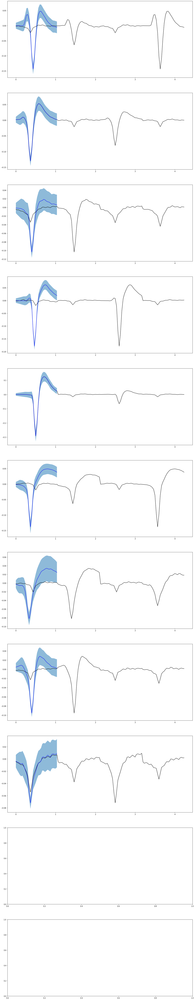

In [23]:
fig, ax = plt.subplots(nrows=len(waveforms[1:])//2,ncols=1,figsize=(20,len(waveforms[1:])*5))
for i,w in enumerate(waveforms[1:]):
    if (i+1)%2==1:
        j = (i+1)//2
#         print(i,(i+1)//2)

        std = waveforms[i+2][len(t)//4*(Template_chan[j]-1):len(t)//4*(Template_chan[j])]
        template = waveforms[i+1][len(t)//4*(Template_chan[j]-1):len(t)//4*(Template_chan[j])]
        ax[j].plot(t,waveforms[i+1],color = 'black')
        ax[j].plot(time,template,color = 'blue')
        ax[j].fill_between(time,template+std,template-std,
                 alpha=.5)
                      

In [28]:
filepath = file_directory.replace('/20220127_dCA1/220204/220204_chan1to16_timestamps.csv',
                                   '/results/220204')

In [32]:
filepath

'/Volumes/GoogleDrive-106311891740711524512/My Drive/Lab/Lab_projects/Daron/tetrode/results/220204'

In [34]:
def Physiology_plot(time,template,std,bins,spk_count,spk,filename):
    fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(20,10))

    # Plot the peak to trough
    ax[0].plot(time,template)
    ax[0].fill_between(time,template+std[-len(t)//4:],template-std[-len(t)//4:],
                     alpha=.5)
    ind = [*np.where(template==min(template))[0],*np.where(template==max(template))[0]]
    ax[0].vlines(time[ind[0]],template[ind[0]]+.05,template[ind[1]]+.1,
               linewidth=1,linestyles='--')
    ax[0].vlines(time[ind[1]],template[ind[1]]+.03,template[ind[1]]+.1,
               linewidth=1,linestyles='--')
    dt = np.diff(time[ind])[0]
    fr=round(len(spk[~np.isnan(spk)])/cont_data['data_time_s'],3)
    ax[0].text(time[ind[0]],template[ind[1]]*1.1,f'$\Delta$t={round(dt,3)}(ms)',fontsize=15)
    ax[0].text(.6,min(template),f'Firing rate: {fr} Hz',
               fontsize=20)
    ax[0].set_ylim([min(template)*1.2,max(template)*2])
    ax[0].set_title(f'{filename}')
    ax[0].set_xlabel(f'Time (ms)')
    ax[0].set_ylabel(f'Waveform value (mV)')
    

    # Plot the autocorrelogram
    BI = burstIndex(bins,spk_count)
    ax[1].step(bins[bins>=-30],spk_count[bins>=-30],where='mid',linewidth=1)
    ax[1].fill_between([3,5],0,max(spk_count)*1.1,
                     facecolor='gray',alpha=.3,clip_on=False)
    ax[1].fill_between([200,300],0,max(spk_count)*1.1,
                     facecolor='gray',alpha=.3,clip_on=False)
    ax[1].text(3,max(spk_count),f'a (3-5 ms)',fontsize=15)
    ax[1].text(205,max(spk_count),f'b (200-300 ms)',fontsize=15)
    ax[1].text(50,max(spk_count)*.3,f'Burst Index (a/b)={round(BI,3)}',fontsize=15)

    ax[1].set_ylim([min(spk_count),max(spk_count)*1.1])
    ax[1].set_xlabel(f'Time (ms)')
    ax[1].set_ylabel(f'Spike counts')
    for a in ax:
        # Hide the spines
        a.spines['right'].set_visible(False)
        a.spines['top'].set_visible(False)

        # Move spines outward by 10 points
        a.spines['left'].set_position(('outward', 10))
        a.spines['bottom'].set_position(('outward', 10))
    [plt.savefig(f'{filepath}/{filename}.{ff}', dpi=500, transparent=True, bbox_inches='tight')
         for ff in ['svg','png']]
    return(dt,BI,fr)
#     plt.show()

In [35]:
dt_list = []
BI_list = []
fr_list = []

IndexError: list index out of range

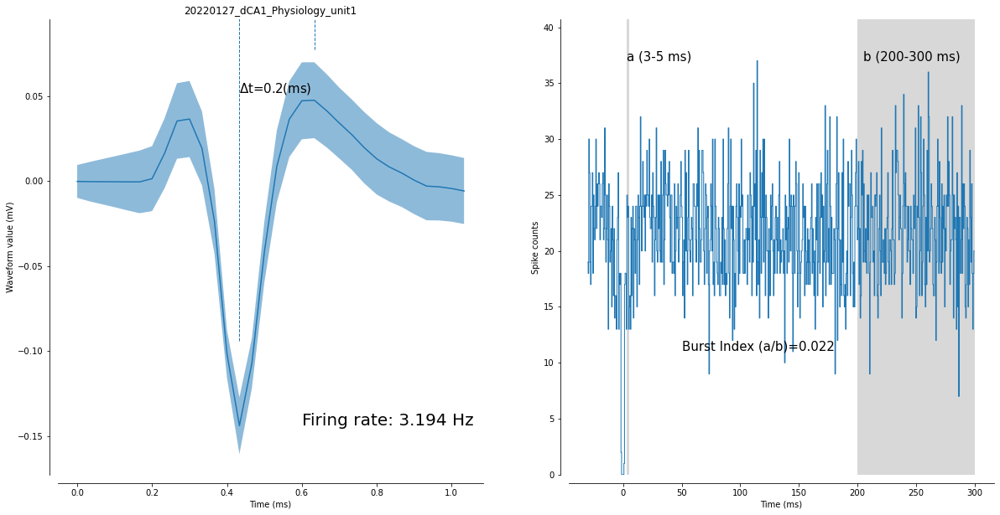

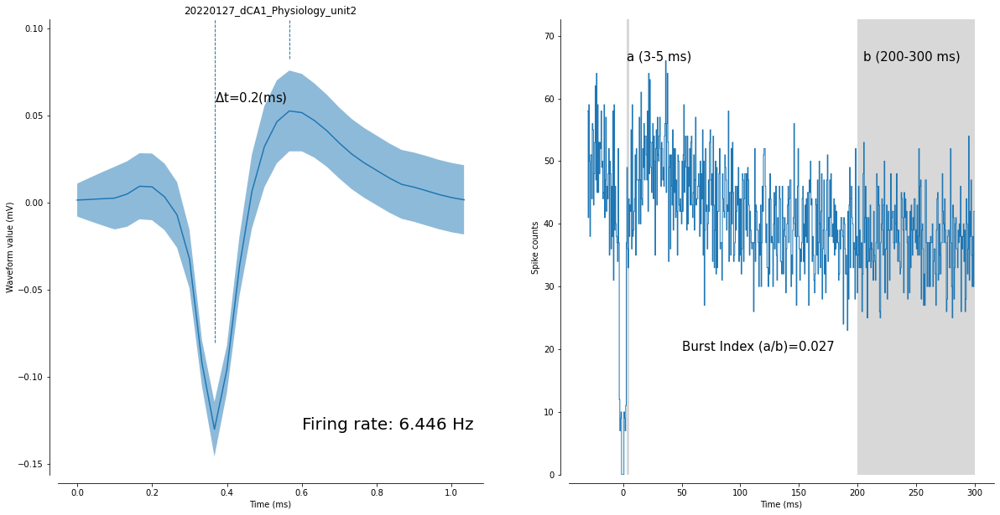

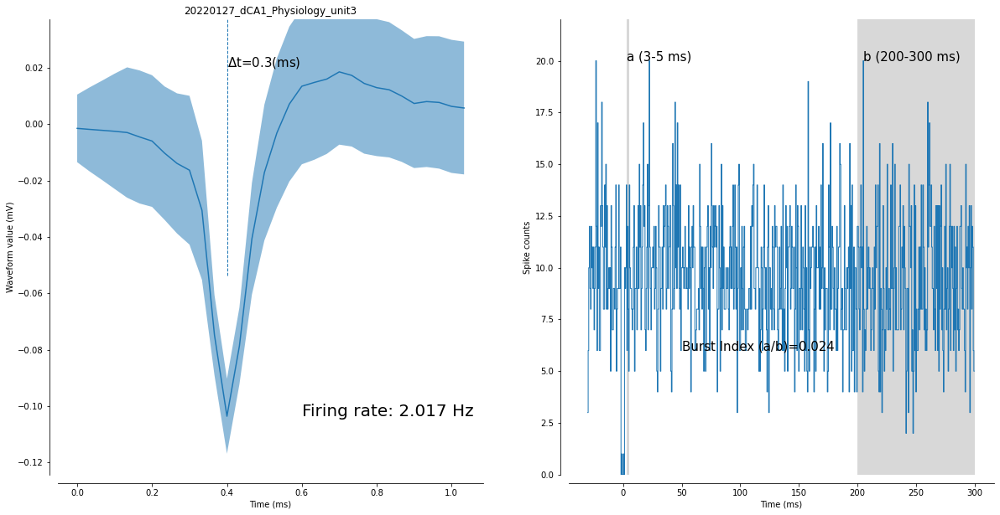

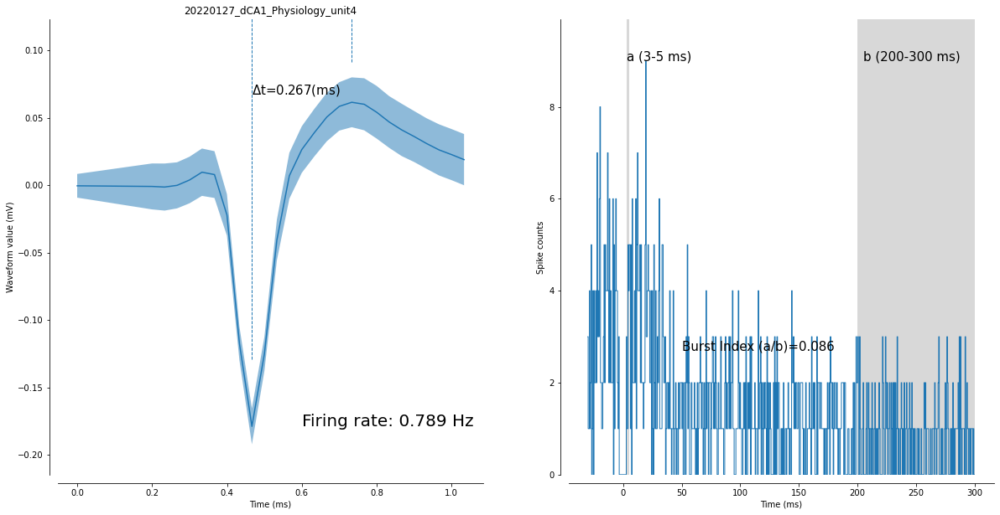

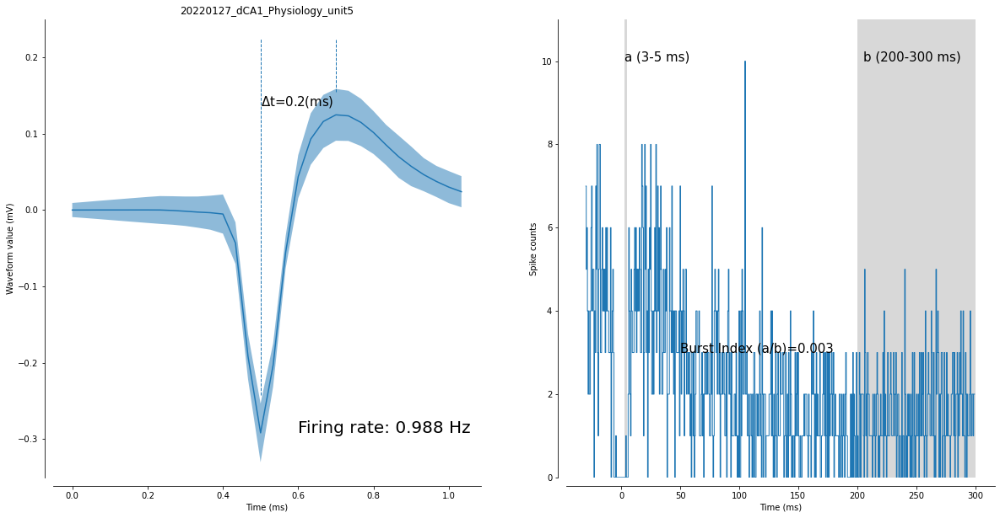

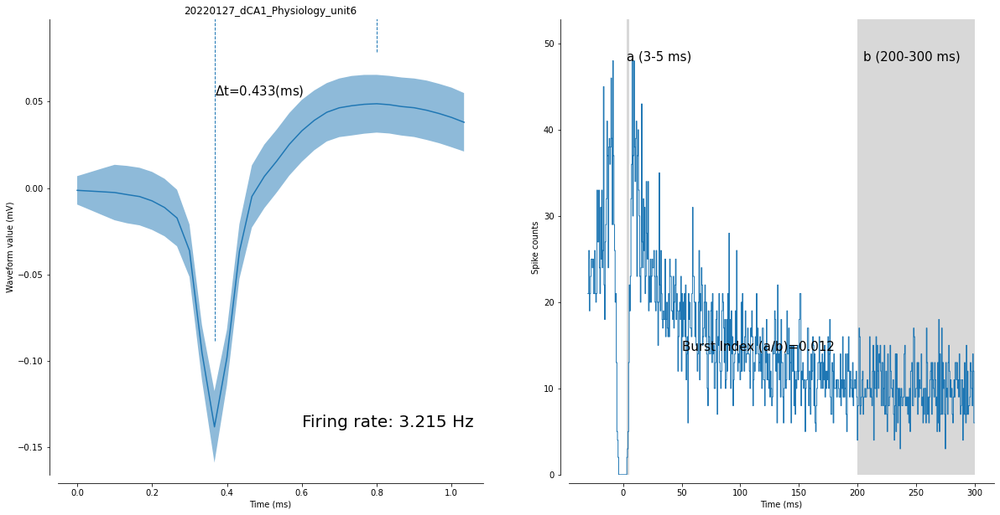

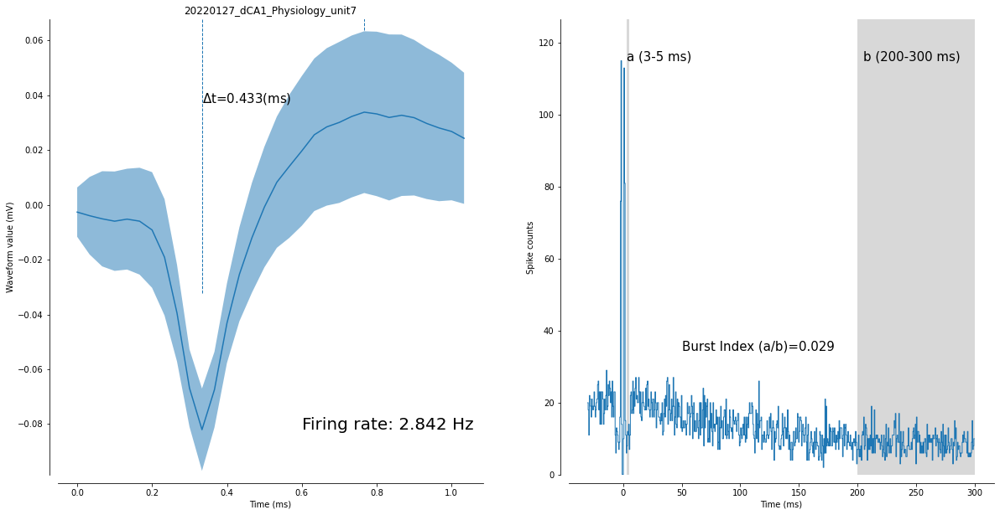

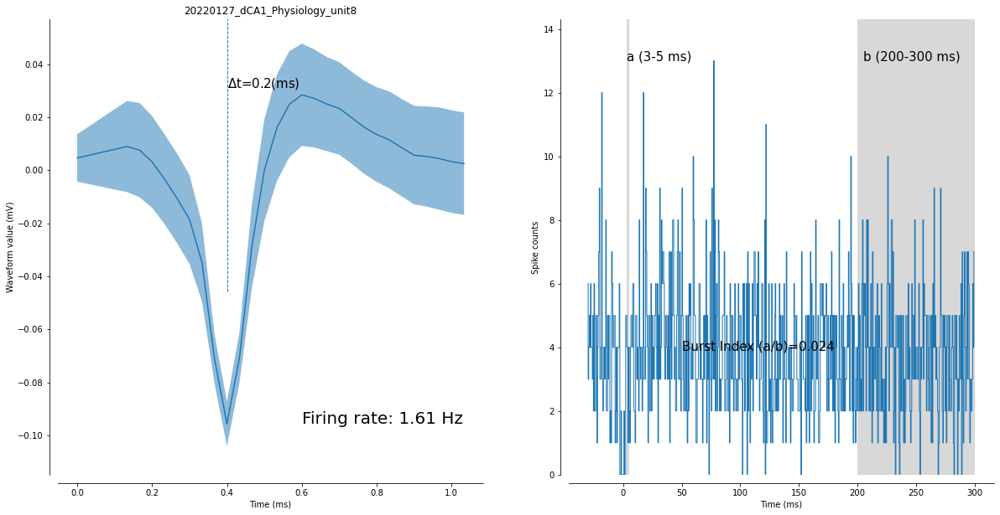

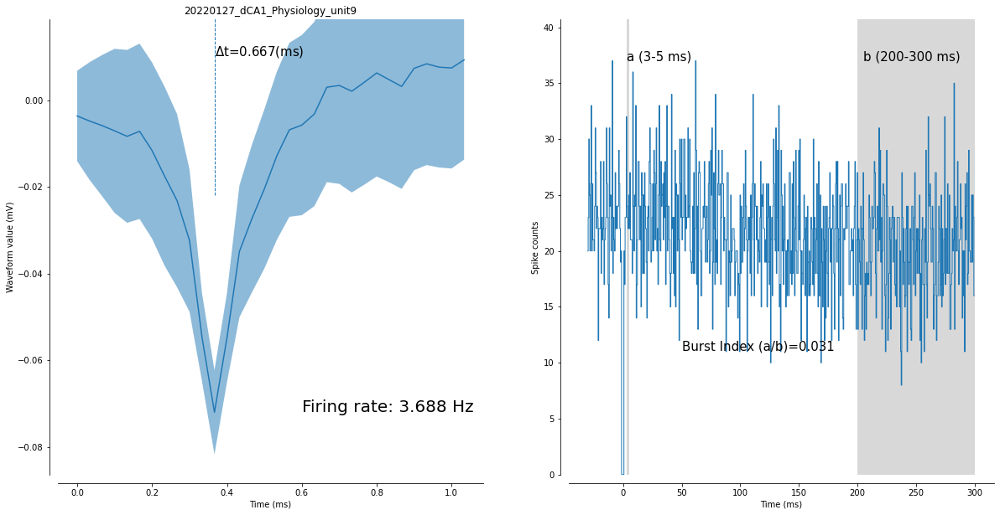

In [36]:
for i,w in enumerate(waveforms[1:]):
    if (i+1)%2==1:
        j = (i+1)//2

        std = waveforms[i+2][len(t)//4*(Template_chan[j]-1):len(t)//4*(Template_chan[j])]
        template = waveforms[i+1][len(t)//4*(Template_chan[j]-1):len(t)//4*(Template_chan[j])]
        spk_count = autocorrelograms[j+1]
        dt,BI,fr = Physiology_plot(time,template,std,bins,spk_count,timestamp[j],f'{fn}_Physiology_unit{j+1}')
        dt_list.append(dt)
        BI_list.append(BI)
        fr_list.append(fr)

In [37]:
fr_list

[3.194, 6.446, 2.017, 0.789, 0.988, 3.215, 2.842, 1.61, 3.688]

<ipython-input-39-406fb775988b>:19: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim([0,1e2])


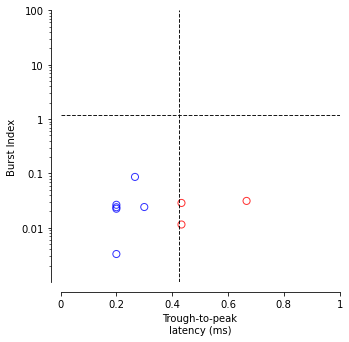

In [39]:
plt.figure(figsize=(5,5))
for i,(dt,BI,fr) in enumerate(zip(dt_list,BI_list,fr_list)):
    if dt<0.425:
        plt.scatter(dt,BI,s=50,facecolors='none',edgecolors='blue',
                    alpha=.8,label=f'Unit{i+1}:{fr}Hz')
    elif dt>=0.425:
        plt.scatter(dt,BI,s=50,facecolors='none',edgecolors='red',
                    alpha=.8,label=f'Unit{i+1}:{fr}Hz')
    else: print('Error')
 
# [plt.text(dt,BI,f'{round(fr,3)} Hz',fontsize=5) 
#  for dt,BI,fr in zip(dt_list,BI_list,fr_list)]
# plt.legend()
plt.plot([0,1],[1.2,1.2],'k--',linewidth=1,alpha=.9)
plt.plot([.425,.425],[1e-3,1e2],'k--',linewidth=1,alpha=.9)
plt.yscale('log')
plt.xticks([0,0.2,0.4,0.6,0.8,1],[0,0.2,0.4,0.6,0.8,1])
plt.yticks([0,0.01,0.1,1,10,100],[0,0.01,0.1,1,10,100])
plt.ylim([0,1e2])
plt.xlim([0,1.0])

a=plt.gca()
a.set_xlabel(f'Trough-to-peak\nlatency (ms)')
a.set_ylabel(f'Burst Index')

# Hide the spines
a.spines['right'].set_visible(False)
a.spines['top'].set_visible(False)

# Move spines outward by 10 points
a.spines['left'].set_position(('outward', 10))
a.spines['bottom'].set_position(('outward', 10))
[plt.savefig(f'{filepath}/Physiology of units.{ff}', dpi=500, transparent=True, bbox_inches='tight')
     for ff in ['svg','png']]
plt.show()


In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [ ]:
x = dt
y = burstIndex

fig, ax = plt.subplots(figsize=(5,5))

divider = make_axes_locatable(ax)

xhax = divider.append_axes("top", size=1, pad=0.1, sharex=ax)
yhax = divider.append_axes("right", size=1, pad=0.1, sharey=ax)

ax.scatter(x, y)
xhax.plot(time,template)
yhax.step(bins[bins>=-30],spk_count[bins>=-30],where='mid',linewidth=1)

##turning off duplicate ticks:
plt.setp(xhax.get_xticklabels(), visible=False)
plt.setp(yhax.get_yticklabels(), visible=False)

plt.show()

30.0